# Self-Driving Car Engineer Nanodegree
## Project: **Advanced Lane Line Detection** 
***
### Import Libraries

In [1]:
import numpy as np
import cv2
import glob
import os
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
%matplotlib inline

### Step 1.a: Camera Calibration
Computing 3D Object Points (World Space) and 2D Image Points (Image Space) from chessboard corners, which can later be used for camera calibration and image undistortion.

In [2]:
# Arrays to store object points and image points from all the images.
ObjPoints = []   # 3D points in World Space
ImgPoints = []   # 2D points in Image Space

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
ObjP = np.zeros((9*6,3),np.float32)

# Generating X-Y Coordinates from ObjP to leave out Z=0
ObjP[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

for fname in images:
    image = cv2.imread(fname)
    
    # Converting to GrayScale
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

    # Finding Chessboard Corners
    ret,corners = cv2.findChessboardCorners(gray,(9,6),None)

    # If found append ObjP and Corners
    if ret==True:
        ImgPoints.append(corners)
        ObjPoints.append(ObjP)

### Step 1.b: Distortion Correction

In [3]:
def cal_undistort(img, objpoints, imgpoints):
    """
    Performs Camera Calibration and Undistorts distorted image
    
    Arguments:
        img-- Distorted color image
        objpoints-- 3D space points
        imgpoints-- 2D image points
        
    Returns: 
        Undistorted image with only one color channel
    """ 
    # Converting to GrayScale
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    
    # Computing Calibration Matrix('mtx'), Distortion Coefficient('dist'),
    # Position of Camera in real world space('rvecs','tvecs')
    ret,mtx,dist,rvecs,tvecs = cv2.calibrateCamera(objpoints,imgpoints,gray.shape[::-1],None,None)
    
    # Finding Undistorted Image('undist')
    undist = cv2.undistort(img,mtx,dist,None,mtx)
    
    return undist

C:\Users\sanke_000\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<Figure size 432x288 with 0 Axes>

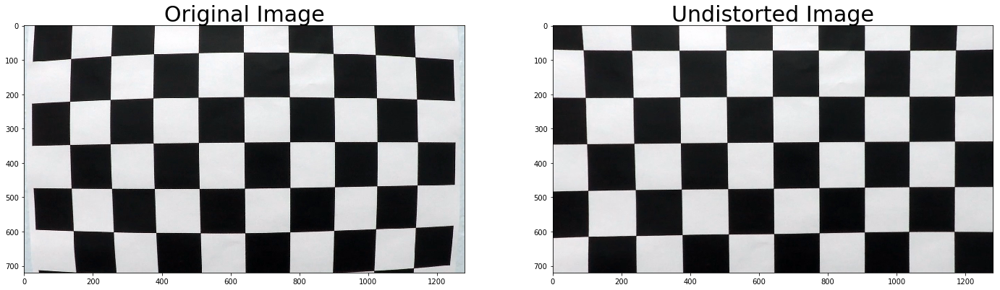

<Figure size 432x288 with 0 Axes>

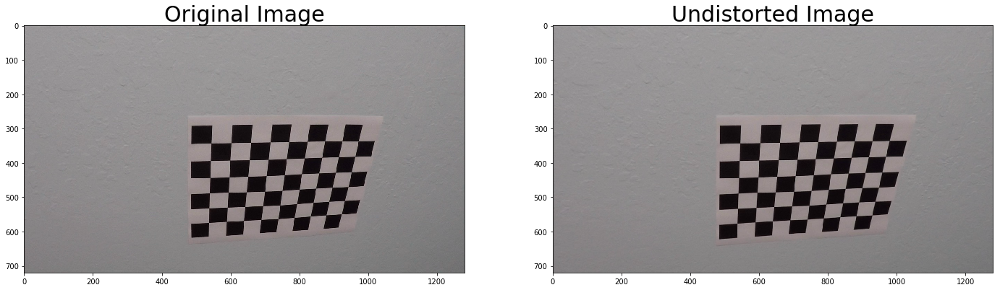

<Figure size 432x288 with 0 Axes>

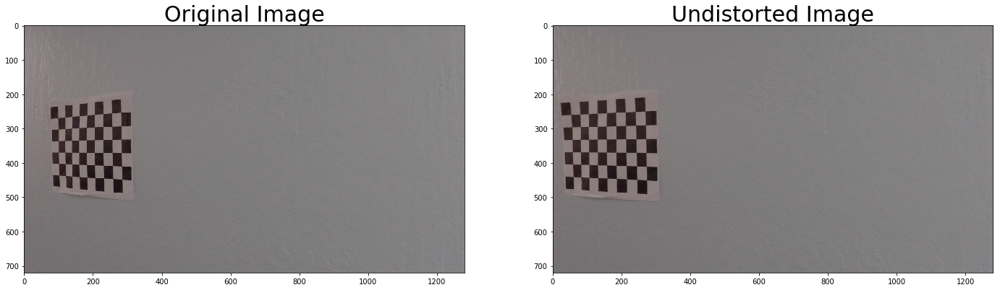

<Figure size 432x288 with 0 Axes>

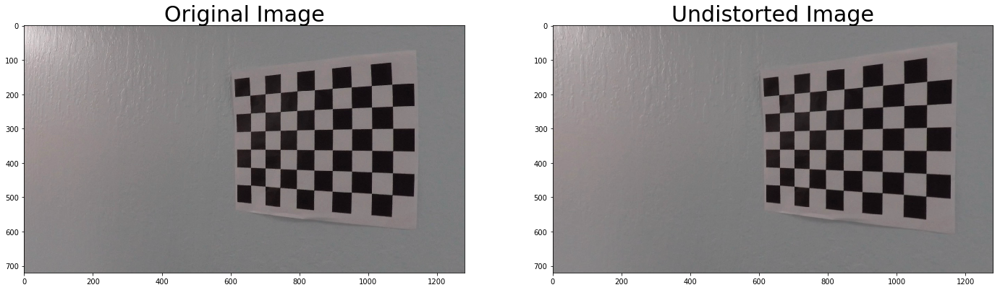

<Figure size 432x288 with 0 Axes>

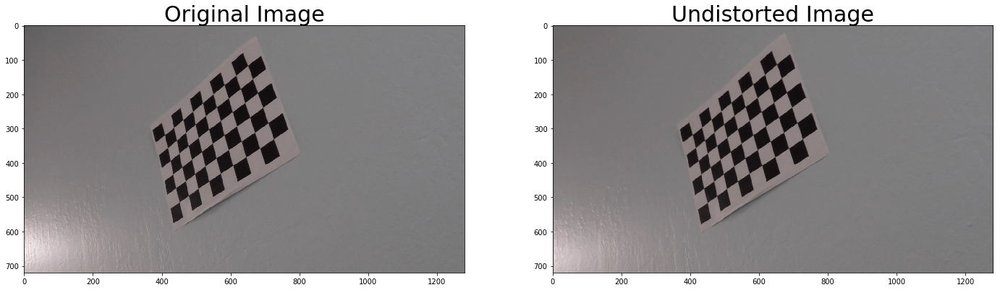

<Figure size 432x288 with 0 Axes>

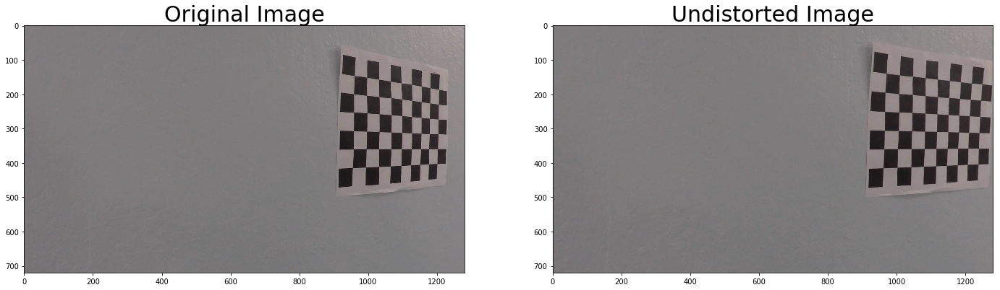

<Figure size 432x288 with 0 Axes>

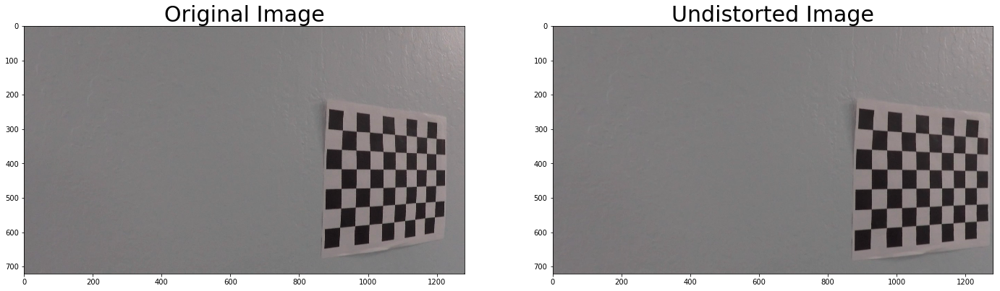

<Figure size 432x288 with 0 Axes>

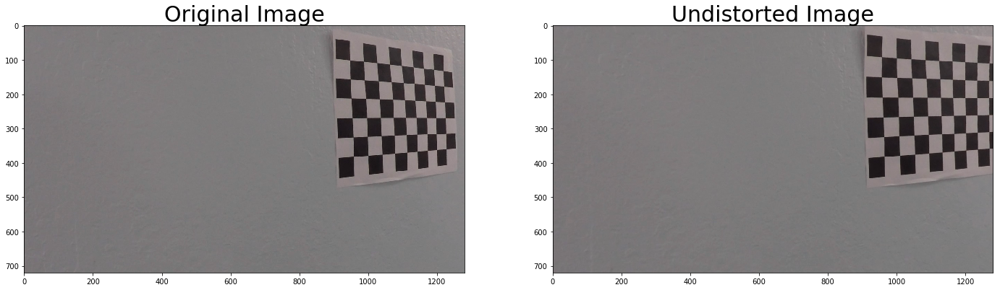

<Figure size 432x288 with 0 Axes>

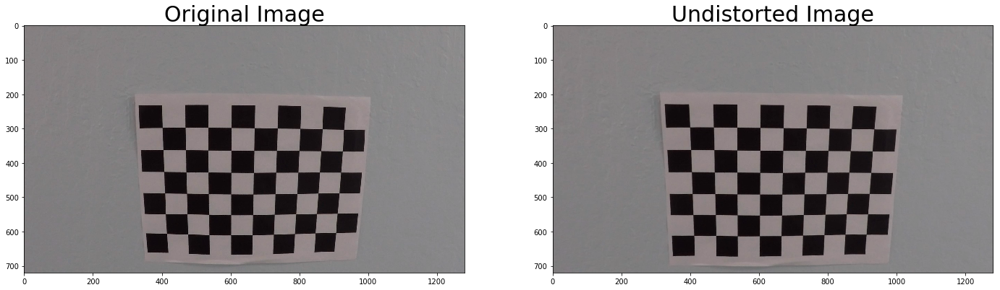

<Figure size 432x288 with 0 Axes>

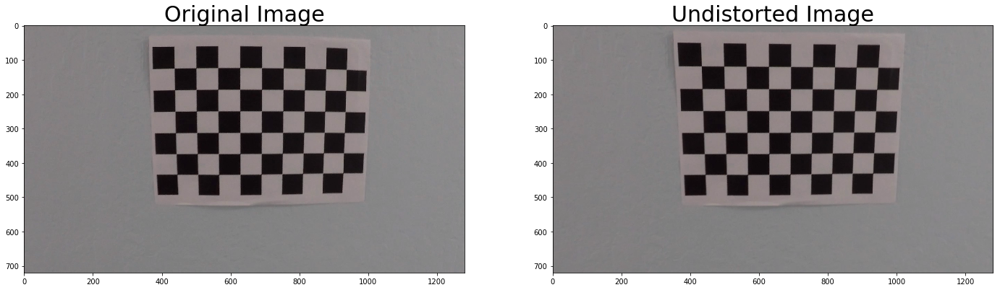

<Figure size 432x288 with 0 Axes>

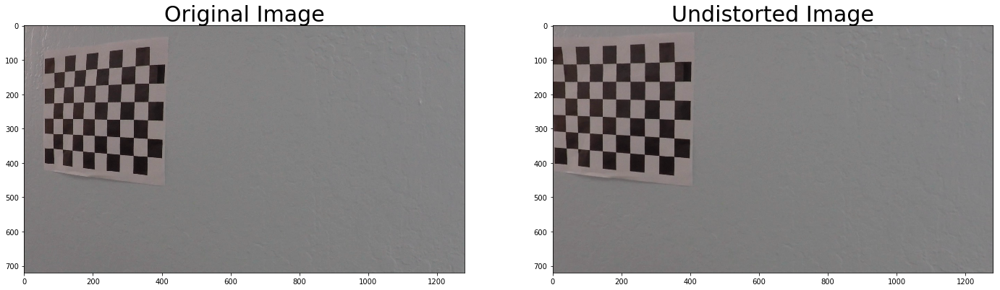

<Figure size 432x288 with 0 Axes>

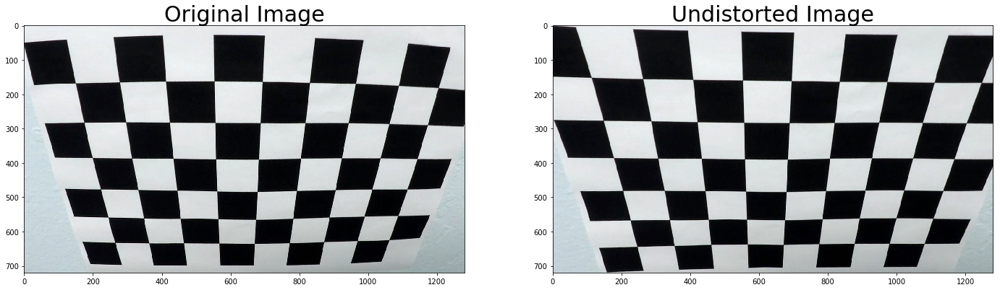

<Figure size 432x288 with 0 Axes>

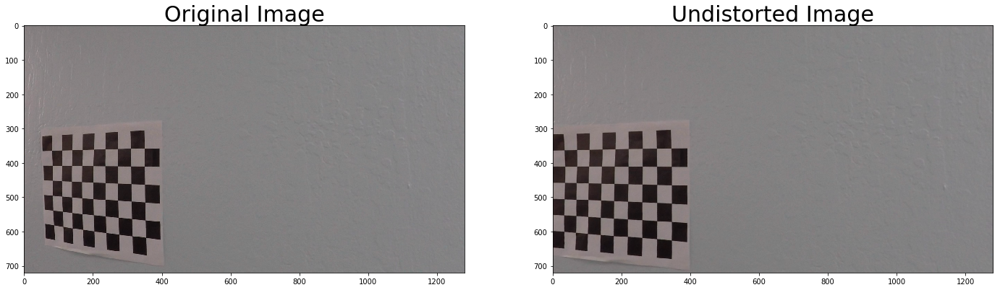

<Figure size 432x288 with 0 Axes>

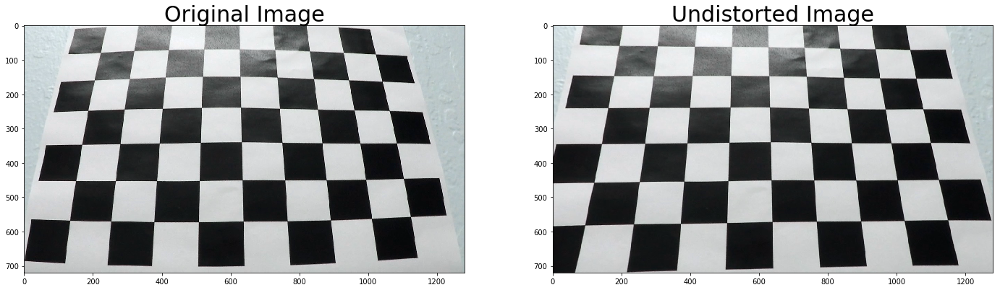

<Figure size 432x288 with 0 Axes>

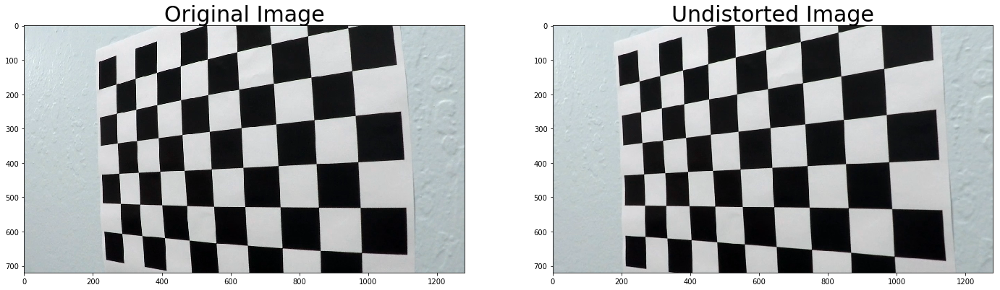

<Figure size 432x288 with 0 Axes>

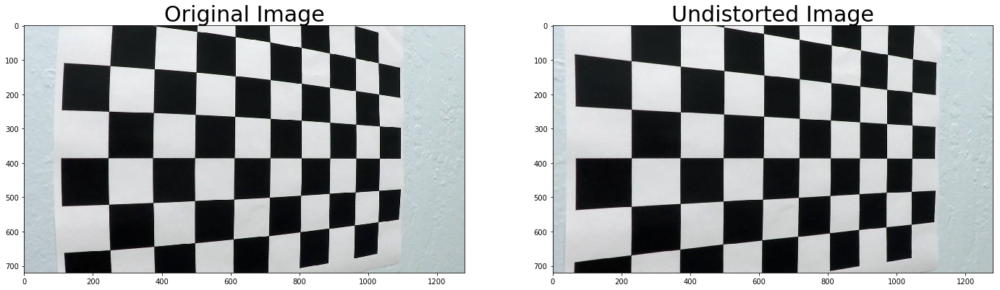

<Figure size 432x288 with 0 Axes>

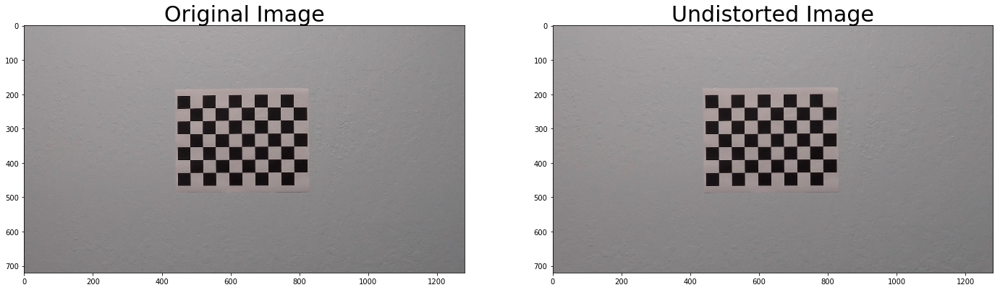

<Figure size 432x288 with 0 Axes>

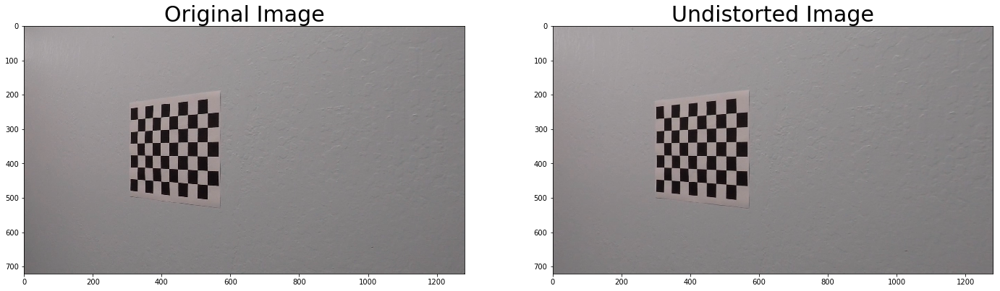

<Figure size 432x288 with 0 Axes>

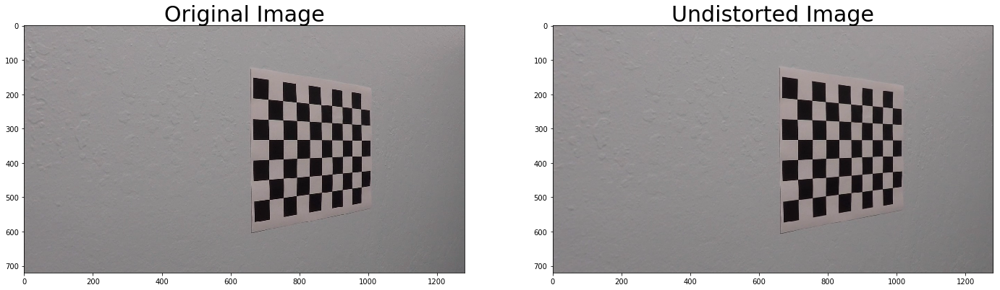

<Figure size 432x288 with 0 Axes>

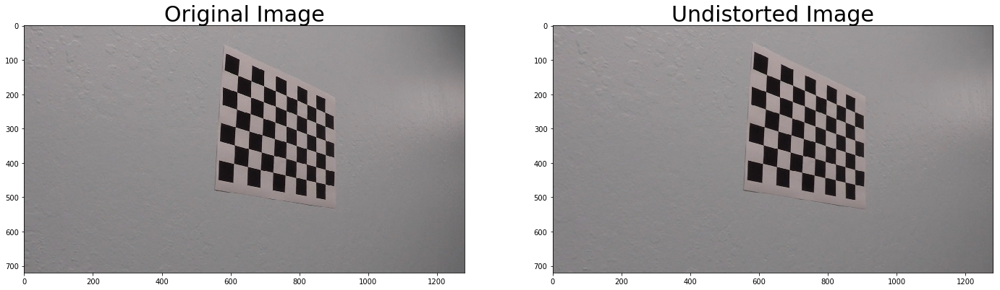

In [4]:
# Testing above function for some test images
images = glob.glob('./camera_cal/calibration*.jpg')

for idx,fname in enumerate(images):
    image = cv2.imread(fname)
    
    undist = cal_undistort(image, ObjPoints, ImgPoints)
    
    fig=plt.figure()
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(undist)
    ax2.set_title('Undistorted Image', fontsize=30)
    fig.savefig('./camera_cal/undistorted/cal%d.jpg'%(idx+1))

### Step 2: Binary Encoding

In [142]:
def binary_image(img):
    """
    Creating Binary Image of the undistorted image by applying color transforms and gradients
    
    Arguments:
        Undistorted Image
    Returns:
        Color Binary Image and Binary Image
    """
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    l_channel = hls[:,:,1]
    
    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 20
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    thresh_min=220
    thresh_max=255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel > thresh_min) & (l_channel <= thresh_max)] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)| (l_binary == 1)] = 1
    
    combined_binary = cv2.GaussianBlur(combined_binary,(5,5),0)
    kernel = np.ones((5, 5), np.uint8)
    closing = cv2.morphologyEx(combined_binary.astype(np.uint8), cv2.MORPH_CLOSE, kernel)
#     opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, kernel)
    
    combined_binary = closing
    return combined_binary,color_binary

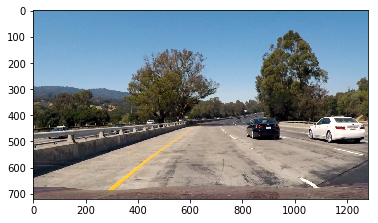

<Figure size 432x288 with 0 Axes>

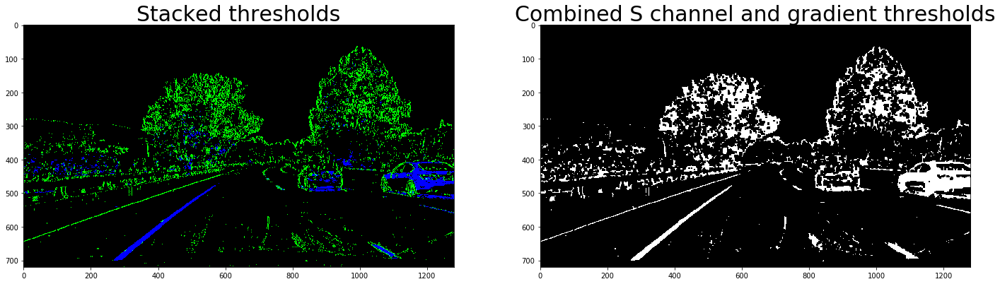

In [143]:
image=plt.imread('./test_images/test1.jpg')
undist = cal_undistort(image, ObjPoints, ImgPoints)
combined_binary,color_binary = binary_image(undist)
plt.imshow(image)
# Plotting thresholded images
fig=plt.figure()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
ax1.set_title('Stacked thresholds',fontsize=30)
ax1.imshow(color_binary)
ax2.set_title('Combined S channel and gradient thresholds',fontsize=30)
ax2.imshow(combined_binary, cmap='gray')
fig.savefig('test_outputs/thresholded_image_test6.jpg')

### Step 3: Perspective Transform

In [99]:
def corners_unwarp(img):
    """
    Performs Perspective Transform on input image
    
    Arguments:
        Binary Image after applying different thresholding
    Returns:
        warped-- Perspective Transformed Binary Warped Image
        M-- Matrix used to perform perspeective Transform, called Transform Matrix
        Minv-- Matrix used to perform inverse of perspective Transform
    """
    imshape = img.shape
    
    # Specify 4 source points in the image on which Perspective transform is to be performed
    src = np.float32([[(imshape[1]*0.45, imshape[0]*0.65),
                       (imshape[1]*0.6, imshape[0]*0.65),
                       (imshape[1]*0.95,imshape[0]),
                       (imshape[1]*0.15,imshape[0])]])
    
    # Specify 4 destination points
    dst = np.float32([[325,0],[1000,0],[900,720],[300,720]])
    
    # Finding M, the transform matrix
    M = cv2.getPerspectiveTransform(src,dst)
    Minv = cv2.getPerspectiveTransform(dst,src)
    
    # using cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img,M,(imshape[1],imshape[0]),flags = cv2.INTER_LINEAR)
    
    return warped, M, Minv

### Step 4: Detect lane pixels and fit to find the lane boundary

In [100]:
def find_lane_pixels(binary_warped):
    """
    Performs Histogram based search algorithm, that finds left and right lane pixels
    
    Argument:
        Binary Warped image available from the Perspective Transformation
    Retuns:
        leftx-- x coordinate of Pixels from Left Lane
        lefty-- y coordinate of Pixels from Left Lane
        rightx-- x coordinate of Pixels from Right Lane
        righty-- y coordinate of Pixels from Right Lane
        out_img-- Output Image to draw lines on
    """
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 10
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

In [144]:
def fit_polynomial(binary_warped):
    """
    Fits a polynomial through the points provided by find_lane_pixels.
    
    Argument:
        Binary Warped image available from the Perspective Transformation
    Returns:
        out_img-- Image containing a line fitted through the Lane pixels
        left_fit, right_fit-- Constant of polynomial fitted on Lane Pixel values (left lane) and (right lane)
    """
    
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty,leftx,2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty,rightx,2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit 

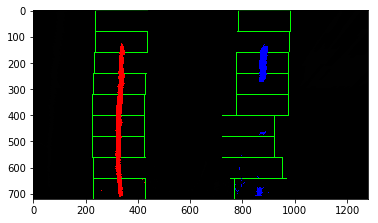

In [145]:
# Computing left_fit, right_fit for the test image

image=plt.imread('./test_images/test1.jpg')
undist = cal_undistort(image, ObjPoints, ImgPoints)
combined_binary,color_binary = binary_image(undist)
binary_warped,M,Minv = corners_unwarp(combined_binary)
fig=plt.figure()
out_img, left_fit, right_fit = fit_polynomial(binary_warped)

plt.imshow(out_img)
fig.savefig('test_outputs/polyfitted.png')

### Step 5: Searching new lane lines from previous lane lines detected

In [146]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    """
    Fits a polynomial through the points provided by find_lane_pixels.
    
    Argument:
        img_shape-- Image shape of Binary Warped image
        leftx, lefty-- left lane line pixel positions
        rightx, righty-- right lane line pixel positions
    Returns:
        result-- Image containing a line fitted through the Lane pixels
        left_fitx, right_fitx-- all the points that fit the complete polynomial line
        left_fit, right_fit-- Constant of polynomial fitted on Lane Pixel values (left lane) and (right lane)
    """
    
    # Fit a second order polynomial to each with np.polyfit()
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty,leftx,2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty,rightx,2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    # Calc both polynomials using ploty, left_fit and right_fit
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, left_fit,right_fit

In [147]:
def search_around_poly(binary_warped):
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
#     out_img, left_fit, right_fit = fit_polynomial(binary_warped)
    
    # Set the area of search based on activated x-values within the +/- margin of our polynomial function
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, left_fit_new,right_fit_new = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
    
    return result, left_fitx, right_fitx, left_fit_new, right_fit_new

### Step 6: Computing Radius of Curvature

In [150]:
def measure_curvature_real(left_fitx, right_fitx):
    '''
    Calculates the curvature of polynomial functions in meters.
    
    Arguments:
        left_fitx, right_fitx-- all the points that fit the complete polynomial line
    Returns:
        Left and right curvature radius of the lane
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    left_curverad, right_curverad, car_pos=(0,0,0)
    
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    r_pos = max(right_fitx)
    l_pos = min(left_fitx)
    center = (r_pos - l_pos)//2
    car_pos = ((image.shape[1]//2) - center)*xm_per_pix
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1+(2*left_fit_cr[0]*y_eval*ym_per_pix+left_fit_cr[1])**2)**(3/2))/abs(2*left_fit_cr[0])  
    right_curverad = ((1+(2*right_fit_cr[0]*y_eval*ym_per_pix+right_fit_cr[1])**2)**(3/2))/abs(2*right_fit_cr[0])  
    
    return left_curverad, right_curverad, car_pos

### Step 7: Drawing Detected line back on Orginal Image

In [159]:
def draw_lane_line(image, binary_warped, left_fitx, right_fitx, Minv):
    '''
    Fills the area between the two detected Lane Lines
    
    Arguments:
        image-- Orginal Image
        binary_warped-- binary warped from perspective transform
        left_fitx, right_fitx-- all the points that fit the complete polynomial line
        Minv-- Matrix used to perform inverse of perspective Transform
    Returns:
        original image with shaded region
    '''
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    ploty = np.linspace(0, image.shape[0]-1, image.shape[0])
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(255,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    
    return result

### Define line class for storing data

In [ ]:

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
        
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)

### Main Pipeline:

In [160]:
def image_pipeline(file_path):     #while running this pipeline on video comment this line
    image= plt.imread(file_path)   #and this line and uncomment the first and last line
# def image_pipeline(image):
    
    undist = cal_undistort(image, ObjPoints, ImgPoints)
    
#     fig=plt.figure()
#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#     ax1.imshow(image)
#     ax1.set_title('Original Image', fontsize=30)
#     ax2.imshow(undist)
#     ax2.set_title('Undistorted Image', fontsize=30)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#     fig.savefig('test_outputs/undistorted_test6.jpg')
    
    
    combined_binary,color_binary = binary_image(undist)
    
#     # Plotting thresholded images
#     fig=plt.figure()
#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
#     ax1.set_title('Stacked thresholds',fontsize=30)
#     ax1.imshow(color_binary)
#     ax2.set_title('Combined S channel and gradient thresholds',fontsize=30)
#     ax2.imshow(combined_binary, cmap='gray')
#     fig.savefig('test_outputs/thresholded_image_test6.jpg')

    
    binary_warped,M, Minv = corners_unwarp(combined_binary)
    
#     # Plotting Warped images
#     fig=plt.figure()
#     fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#     ax1.imshow(image)
#     ax1.set_title('Original Image', fontsize=30)
#     ax2.imshow(binary_warped,cmap='gray')
#     ax2.set_title('Undistorted and Warped Image', fontsize=30)
#     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#     fig.savefig('test_outputs/warped_image_test6.jpg')
    
#     fig=plt.figure()

    out_img, left_fitx, right_fitx, left_fit, right_fit = search_around_poly(binary_warped)
    
#     # View your output
#     plt.imshow(out_img)
#     plt.title('Search region of Lanes for next frame',fontsize=30)
#     fig.savefig('test_outputs/search_region_test6.jpg')
    
    
    result = draw_lane_line(image, binary_warped, left_fitx, right_fitx, Minv)
    
    left_curverad, right_curverad = measure_curvature_real(left_fitx,right_fitx)
    curve_rad = (left_curverad+right_curverad)/2
    
    font = cv2.FONT_HERSHEY_DUPLEX
    text1 = 'Curve Radius = '+str("{0:.2f}".format(left_curverad/1000))+' km'
    cv2.putText(result, text1, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    text2 = 'Car Position from center = '+str("{0:.2f}".format(car_pos))+' m'
    cv2.putText(result, text2, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    
    return result

### Implementing on test images: 

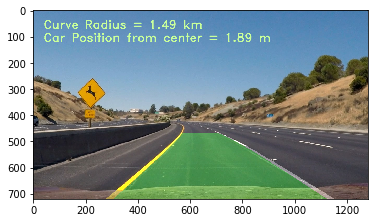

In [162]:
result = image_pipeline("test_images/test2.jpg")
fig=plt.figure()
plt.imshow(result)
# plt.title('final output', fontsize=30)
# fig.savefig('test_outputs/final_image_test6.jpg')
# for file in os.listdir("test_images/"):
#     file_path=os.path.join("test_images/",file)
#     result = image_pipeline(file_path)
#     fig=plt.figure()
#     plt.imshow(result)

### Implementing on video:

In [20]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4




  0%|                                                  | 0/126 [00:00<?, ?it/s]

  1%|▎                                         | 1/126 [00:03<08:19,  4.00s/it]

  2%|▋                                         | 2/126 [00:08<08:17,  4.01s/it]

  2%|█                                         | 3/126 [00:12<08:15,  4.02s/it]

  3%|█▎                                        | 4/126 [00:16<08:11,  4.03s/it]

  4%|█▋                                        | 5/126 [00:20<08:16,  4.10s/it]

  5%|██                                        | 6/126 [00:24<08:09,  4.08s/it]

  6%|██▎                                       | 7/126 [00:28<08:08,  4.10s/it]

  6%|██▋                                       | 8/126 [00:32<08:01,  4.08s/it]

  7%|███                                       | 9/126 [00:36<08:01,  4.12s/it]

  8%|███▎                                     | 10/126 [00:41<08:05,  4.19s/it]

  9%|███▌                                     | 11/126 [00:45<08:06,  4.23s/it]

 10%|███▉                 

 80%|████████████████████████████████        | 101/126 [07:15<01:48,  4.33s/it]

 81%|████████████████████████████████▍       | 102/126 [07:19<01:41,  4.23s/it]

 82%|████████████████████████████████▋       | 103/126 [07:23<01:38,  4.27s/it]

 83%|█████████████████████████████████       | 104/126 [07:27<01:32,  4.21s/it]

 83%|█████████████████████████████████▎      | 105/126 [07:32<01:28,  4.19s/it]

 84%|█████████████████████████████████▋      | 106/126 [07:36<01:24,  4.22s/it]

 85%|█████████████████████████████████▉      | 107/126 [07:40<01:19,  4.18s/it]

 86%|██████████████████████████████████▎     | 108/126 [07:44<01:15,  4.21s/it]

 87%|██████████████████████████████████▌     | 109/126 [07:49<01:14,  4.38s/it]

 87%|██████████████████████████████████▉     | 110/126 [07:53<01:10,  4.41s/it]

 88%|███████████████████████████████████▏    | 111/126 [07:58<01:05,  4.37s/it]

 89%|███████████████████████████████████▌    | 112/126 [08:02<01:02,  4.47s/it]

 90%|███████████████████████

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 9min 2s


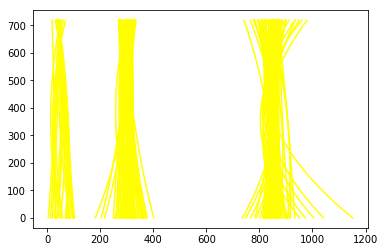

In [107]:
video_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4").subclip(20,25)
# clip1 = VideoFileClip("project_video.mp4")
video_clip = clip1.fl_image(image_pipeline) #NOTE: this function expects color images!!
%time video_clip.write_videofile(video_output, audio=False)

In [108]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

In [72]:
challenge_output = 'challeneg_video_output.mp4'

In [70]:
# clip2 = VideoFileClip("challenge_video.mp4").subclip(0v,5)
clip2 = VideoFileClip("challenge_video.mp4")
challenge_clip = clip2.fl_image(image_pipeline) #NOTE: this function expects color images!!
%time challenge_clip.write_videofile(challenge_output, audio=False)

In [73]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))